# Assignment - 3

#### Krithika Devi Chandran
#### 2211570
#### Cohort: Data, AI & ML

Agenda
* Problem Statement
* Dataset & Objective
* Data Description
* Load Data
* Data Visualization
* Data Pre-Processing
* Evaluation Methods to identify optimum number of clusters
   * Elbow Method
   * Silhouette Method
* Training the K-means algorithm on the input dataset
* Visualizing the clusters

### Problem Statement

Build two k-means models by loading (built-in) breast cancer data 

* **Using scikit learn**


### **Dataset & Objective**

**Load Python in-built Breast cancer dataset**

For the given **'Breast Cancer'** dataset, our objective is to predict the optimum number of clusters and represent it visuallly. For this, K-Means clustering is used to segement the species efficiently.
      

### **Data Description**

Breast Cancer Dataset Characteristics is Multivariate. It contains 30 features of 569 samples of two diagnosis status of target variable (0 = malignant, 1 = benign).

* ***Attribute Information***
    
**Dependent feature:**  
target (0 = malignant, 1 = benign) [it's a diagnosis status]

**Independent features:**

For each cell nucleus, the following ten characteristics were measured:

* radius (mean of distances from center to points on the perimeter)
* texture (standard deviation of gray-scale values)
* perimeter
* area
* smoothness (local variation in radius lengths)
* compactness (perimeter^2 / area - 1.0)
* concavity (severity of concave portions of the contour)
* concave points (number of concave portions of the contour)
* symmetry
* fractal dimension ("coastline approximation" - 1)

For each characteristic three measures are given:

* mean
* standard error
* largest/"worst"

### **Load Data**

In [1]:
from sklearn import datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
load_data = datasets.load_breast_cancer()
load_data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [4]:
load_data['data']

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [5]:
load_data['target']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [6]:
feature_names = load_data['feature_names']
feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [7]:
df = pd.DataFrame(load_data['data'], columns = feature_names)
df['target'] = load_data['target']
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [8]:
renamed_col = {'target': {0:'Malignant',1:'Benign'}}
df.replace(renamed_col, inplace=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [10]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [11]:
df['target'].value_counts()

Benign       357
Malignant    212
Name: target, dtype: int64

### **Data Visualization**

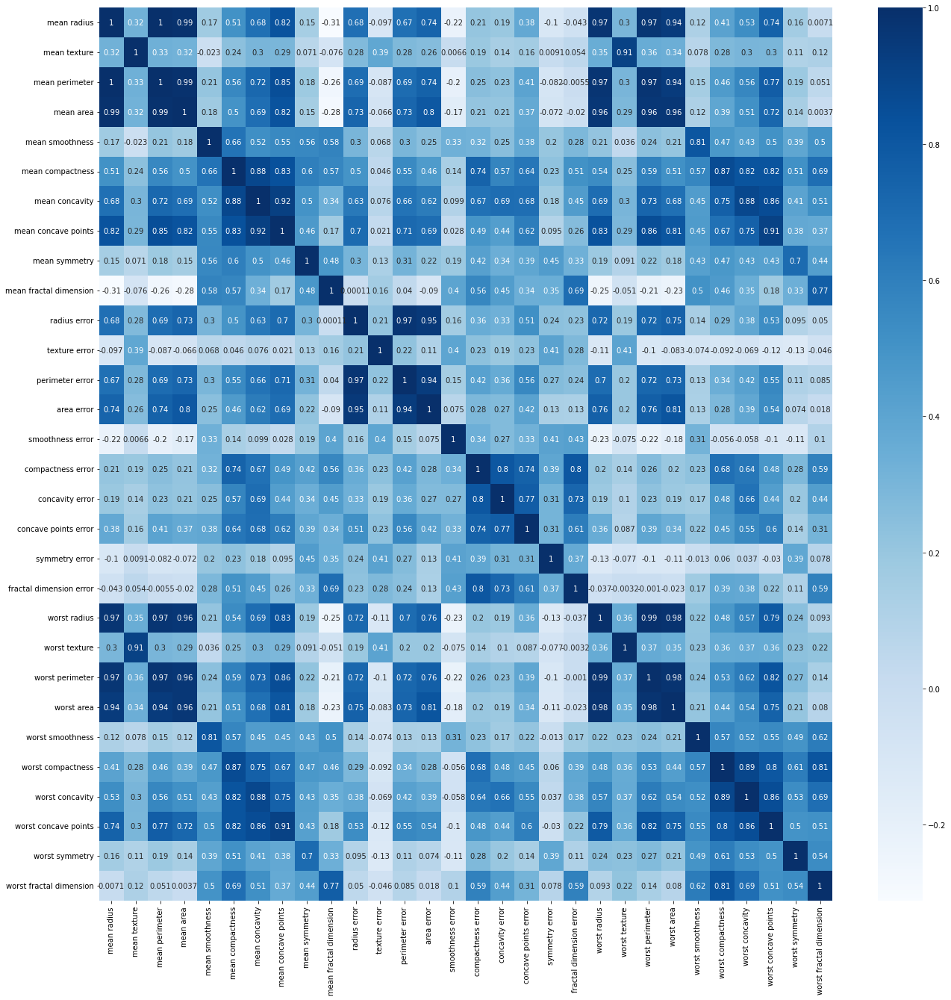

In [12]:
fig=plt.figure(figsize=(22,22))
sns.heatmap(df.corr(), annot=True, cmap='Blues')
plt.show()
fig.savefig('credit_default_heatmap.png')

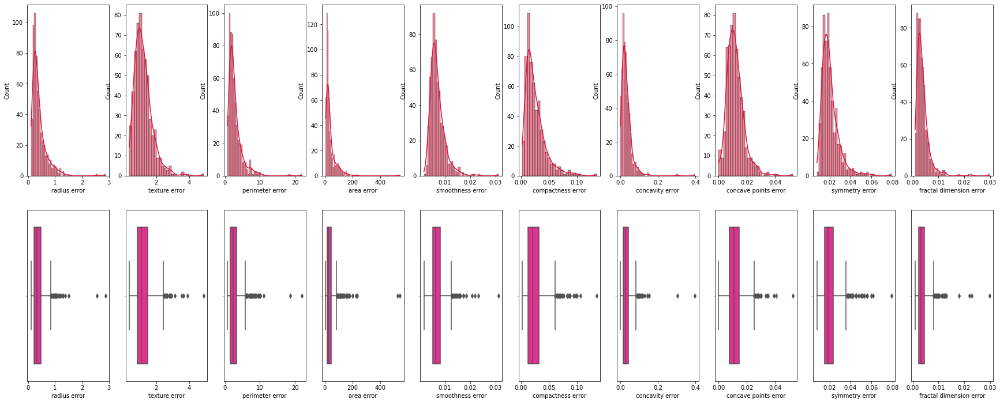

In [13]:
fig,ax = plt.subplots(nrows=2,ncols=10,figsize=(30,12))
sns.histplot(data = df, x='radius error',kde=True,color='crimson',ax=ax[0,0])
sns.histplot(data = df, x='texture error',kde=True,color='crimson',ax=ax[0,1])
sns.histplot(data = df, x='perimeter error',kde=True,color='crimson',ax=ax[0,2])
sns.histplot(data = df, x='area error',kde=True,color='crimson',ax=ax[0,3])
sns.histplot(data = df, x='smoothness error',kde=True,color='crimson',ax=ax[0,4])
sns.histplot(data = df, x='compactness error',kde=True,color='crimson',ax=ax[0,5])
sns.histplot(data = df, x='concavity error',kde=True,color='crimson',ax=ax[0,6])
sns.histplot(data = df, x='concave points error',kde=True,color='crimson',ax=ax[0,7])
sns.histplot(data = df, x='symmetry error',kde=True,color='crimson',ax=ax[0,8])
sns.histplot(data = df, x='fractal dimension error',kde=True,color='crimson',ax=ax[0,9])

sns.boxplot(data = df,x='radius error',color='deeppink',ax=ax[1,0])
sns.boxplot(data = df, x='texture error',color='deeppink',ax=ax[1,1])
sns.boxplot(data = df, x='perimeter error',color='deeppink',ax=ax[1,2])
sns.boxplot(data = df, x='area error',color='deeppink',ax=ax[1,3])
sns.boxplot(data = df, x='smoothness error',color='deeppink',ax=ax[1,4])
sns.boxplot(data = df, x='compactness error',color='deeppink',ax=ax[1,5])
sns.boxplot(data = df, x='concavity error',color='deeppink',ax=ax[1,6])
sns.boxplot(data = df, x='concave points error',color='deeppink',ax=ax[1,7])
sns.boxplot(data = df, x='symmetry error',color='deeppink',ax=ax[1,8])
sns.boxplot(data = df, x='fractal dimension error',color='deeppink',ax=ax[1,9])

plt.show()

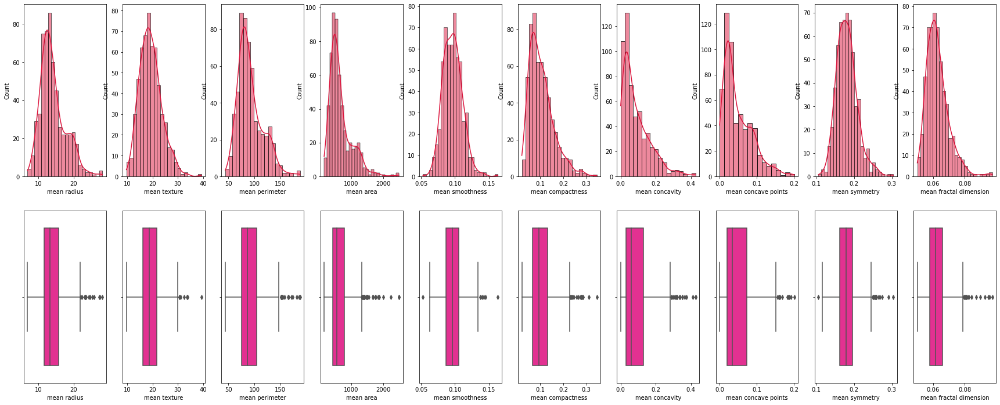

In [14]:
fig,ax = plt.subplots(nrows=2,ncols=10,figsize=(30,12))
sns.histplot(data = df, x='mean radius',kde=True,color='crimson',ax=ax[0,0])
sns.histplot(data = df, x='mean texture',kde=True,color='crimson',ax=ax[0,1])
sns.histplot(data = df, x='mean perimeter',kde=True,color='crimson',ax=ax[0,2])
sns.histplot(data = df, x='mean area',kde=True,color='crimson',ax=ax[0,3])
sns.histplot(data = df, x='mean smoothness',kde=True,color='crimson',ax=ax[0,4])
sns.histplot(data = df, x='mean compactness',kde=True,color='crimson',ax=ax[0,5])
sns.histplot(data = df, x='mean concavity',kde=True,color='crimson',ax=ax[0,6])
sns.histplot(data = df, x='mean concave points',kde=True,color='crimson',ax=ax[0,7])
sns.histplot(data = df, x='mean symmetry',kde=True,color='crimson',ax=ax[0,8])
sns.histplot(data = df, x='mean fractal dimension',kde=True,color='crimson',ax=ax[0,9])

sns.boxplot(data = df,x='mean radius',color='deeppink',ax=ax[1,0])
sns.boxplot(data = df, x='mean texture',color='deeppink',ax=ax[1,1])
sns.boxplot(data = df, x='mean perimeter',color='deeppink',ax=ax[1,2])
sns.boxplot(data = df, x='mean area',color='deeppink',ax=ax[1,3])
sns.boxplot(data = df, x='mean smoothness',color='deeppink',ax=ax[1,4])
sns.boxplot(data = df, x='mean compactness',color='deeppink',ax=ax[1,5])
sns.boxplot(data = df, x='mean concavity',color='deeppink',ax=ax[1,6])
sns.boxplot(data = df, x='mean concave points',color='deeppink',ax=ax[1,7])
sns.boxplot(data = df, x='mean symmetry',color='deeppink',ax=ax[1,8])
sns.boxplot(data = df, x='mean fractal dimension',color='deeppink',ax=ax[1,9])

plt.show()

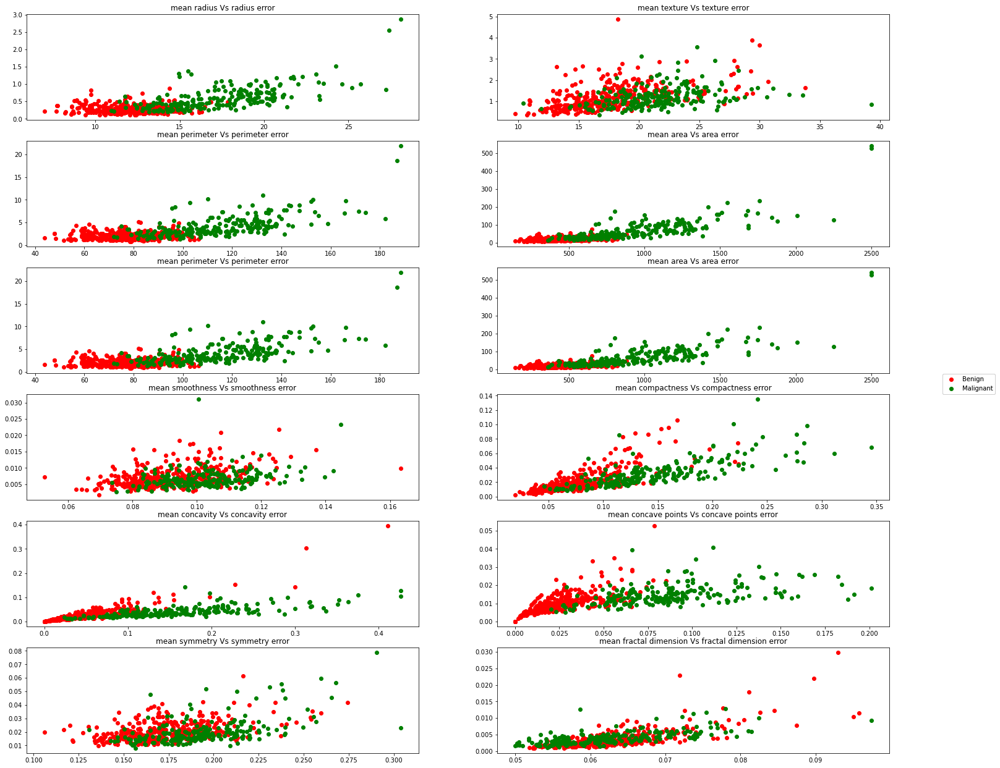

In [61]:
colors = ['red','green']
labelled = ['Benign','Malignant']
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(25,22))

for i in range(2):
    targ = df[df['target']==labelled[i]]
    ax[0,0].scatter(x=targ['mean radius'], y=targ['radius error'], c=colors[i])
    ax[0,0].set_title("mean radius Vs radius error")
    ax[0,1].scatter(x=targ['mean texture'], y=targ['texture error'], c=colors[i])
    ax[0,1].set_title("mean texture Vs texture error")
    ax[1,0].scatter(x=targ['mean perimeter'], y=targ['perimeter error'], c=colors[i])
    ax[1,0].set_title("mean perimeter Vs perimeter error")
    ax[1,1].scatter(x=targ['mean area'], y=targ['area error'], c=colors[i])
    ax[1,1].set_title("mean area Vs area error")
    ax[2,0].scatter(x=targ['mean perimeter'], y=targ['perimeter error'], c=colors[i])
    ax[2,0].set_title("mean perimeter Vs perimeter error")
    ax[2,1].scatter(x=targ['mean area'], y=targ['area error'], c=colors[i])
    ax[2,1].set_title("mean area Vs area error")
    ax[3,0].scatter(x=targ['mean smoothness'], y=targ['smoothness error'], c=colors[i])
    ax[3,0].set_title("mean smoothness Vs smoothness error")
    ax[3,1].scatter(x=targ['mean compactness'], y=targ['compactness error'], c=colors[i])
    ax[3,1].set_title("mean compactness Vs compactness error")
    ax[4,0].scatter(x=targ['mean concavity'], y=targ['concavity error'], c=colors[i])
    ax[4,0].set_title("mean concavity Vs concavity error")
    ax[4,1].scatter(x=targ['mean concave points'], y=targ['concave points error'], c=colors[i])
    ax[4,1].set_title("mean concave points Vs concave points error")
    ax[5,0].scatter(x=targ['mean symmetry'], y=targ['symmetry error'], c=colors[i])
    ax[5,0].set_title("mean symmetry Vs symmetry error")
    ax[5,1].scatter(x=targ['mean fractal dimension'], y=targ['fractal dimension error'], c=colors[i])
    ax[5,1].set_title("mean fractal dimension Vs fractal dimension error")

    
    
  # Create the legend
    fig.legend(colors,     # The color objects
               labels=labelled,   # The labels for each line
               loc="center right",   # Position of legend
               borderaxespad=0.8,    # Small spacing around legend box
               )


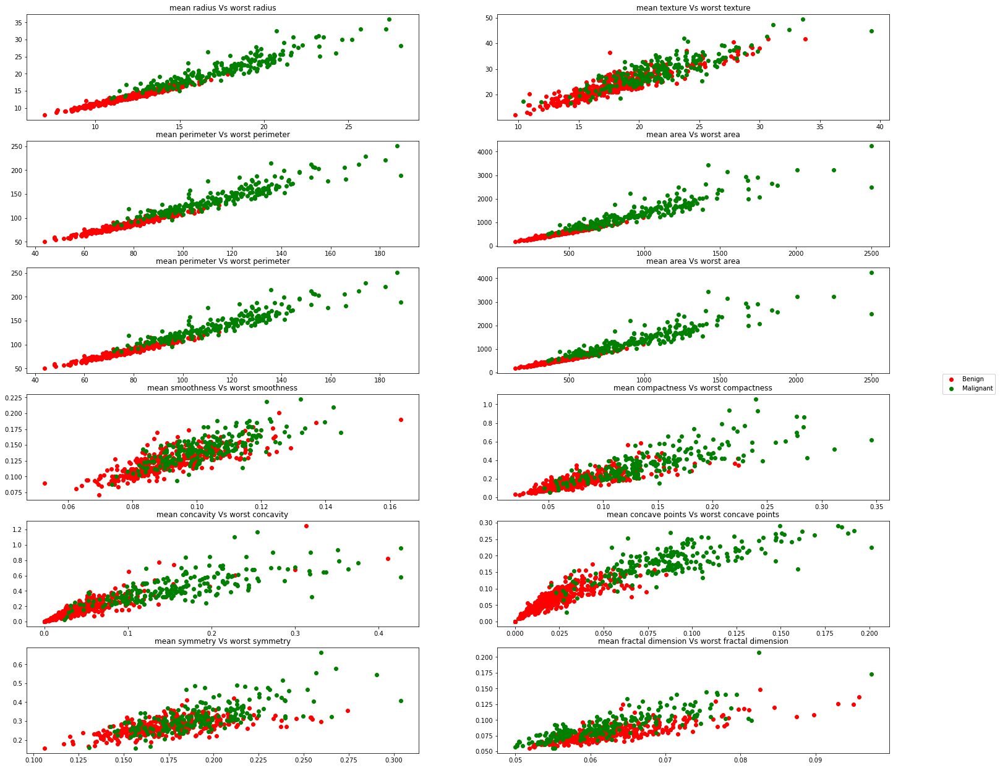

In [63]:
colors = ['red','green']
labelled = ['Benign','Malignant']
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(25,22))

for i in range(2):
    targ = df[df['target']==labelled[i]]
    ax[0,0].scatter(x=targ['mean radius'], y=targ['worst radius'], c=colors[i])
    ax[0,0].set_title("mean radius Vs worst radius")
    ax[0,1].scatter(x=targ['mean texture'], y=targ['worst texture'], c=colors[i])
    ax[0,1].set_title("mean texture Vs worst texture")
    ax[1,0].scatter(x=targ['mean perimeter'], y=targ['worst perimeter'], c=colors[i])
    ax[1,0].set_title("mean perimeter Vs worst perimeter")
    ax[1,1].scatter(x=targ['mean area'], y=targ['worst area'], c=colors[i])
    ax[1,1].set_title("mean area Vs worst area")
    ax[2,0].scatter(x=targ['mean perimeter'], y=targ['worst perimeter'], c=colors[i])
    ax[2,0].set_title("mean perimeter Vs worst perimeter")
    ax[2,1].scatter(x=targ['mean area'], y=targ['worst area'], c=colors[i])
    ax[2,1].set_title("mean area Vs worst area")
    ax[3,0].scatter(x=targ['mean smoothness'], y=targ['worst smoothness'], c=colors[i])
    ax[3,0].set_title("mean smoothness Vs worst smoothness")
    ax[3,1].scatter(x=targ['mean compactness'], y=targ['worst compactness'], c=colors[i])
    ax[3,1].set_title("mean compactness Vs worst compactness")
    ax[4,0].scatter(x=targ['mean concavity'], y=targ['worst concavity'], c=colors[i])
    ax[4,0].set_title("mean concavity Vs worst concavity")
    ax[4,1].scatter(x=targ['mean concave points'], y=targ['worst concave points'], c=colors[i])
    ax[4,1].set_title("mean concave points Vs worst concave points")
    ax[5,0].scatter(x=targ['mean symmetry'], y=targ['worst symmetry'], c=colors[i])
    ax[5,0].set_title("mean symmetry Vs worst symmetry")
    ax[5,1].scatter(x=targ['mean fractal dimension'], y=targ['worst fractal dimension'], c=colors[i])
    ax[5,1].set_title("mean fractal dimension Vs worst fractal dimension")

    
    
  # Create the legend
    fig.legend(colors,     # The color objects
               labels=labelled,   # The labels for each line
               loc="center right",   # Position of legend
               borderaxespad=0.8,    # Small spacing around legend box
               )


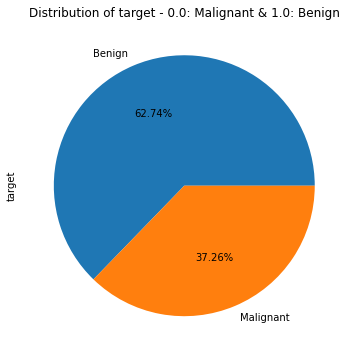

In [222]:
df['target'].value_counts().plot.pie(figsize=(6, 6), autopct='%.2f%%')
plt.title("Distribution of target - 0.0: Malignant & 1.0: Benign")
plt.show()

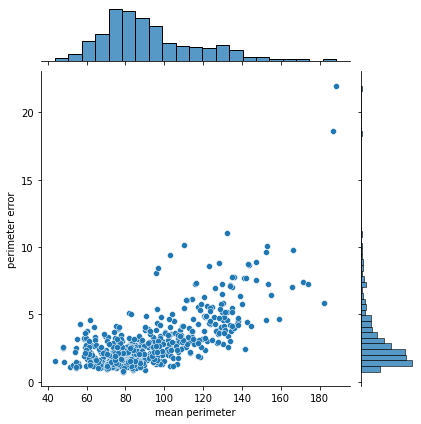

In [223]:
sns.jointplot(x='mean perimeter',y='perimeter error',data=df)
plt.show()

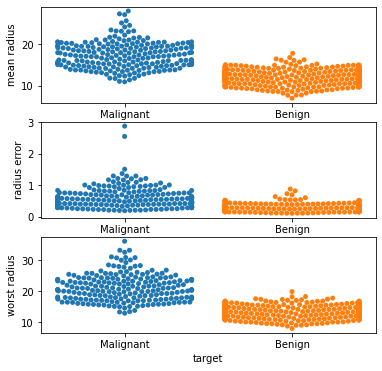

In [67]:
# Visualizing Species Vs SepalLength,WidthCm & Species Vs PetaLength,WidthCm
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6,6))

sns.swarmplot(x='target', y='mean radius', data=df, ax=axes[0])
sns.swarmplot(x='target', y='radius error', data=df, ax=axes[1])
sns.swarmplot(x='target', y='worst radius', data=df, ax=axes[2])

plt.show()

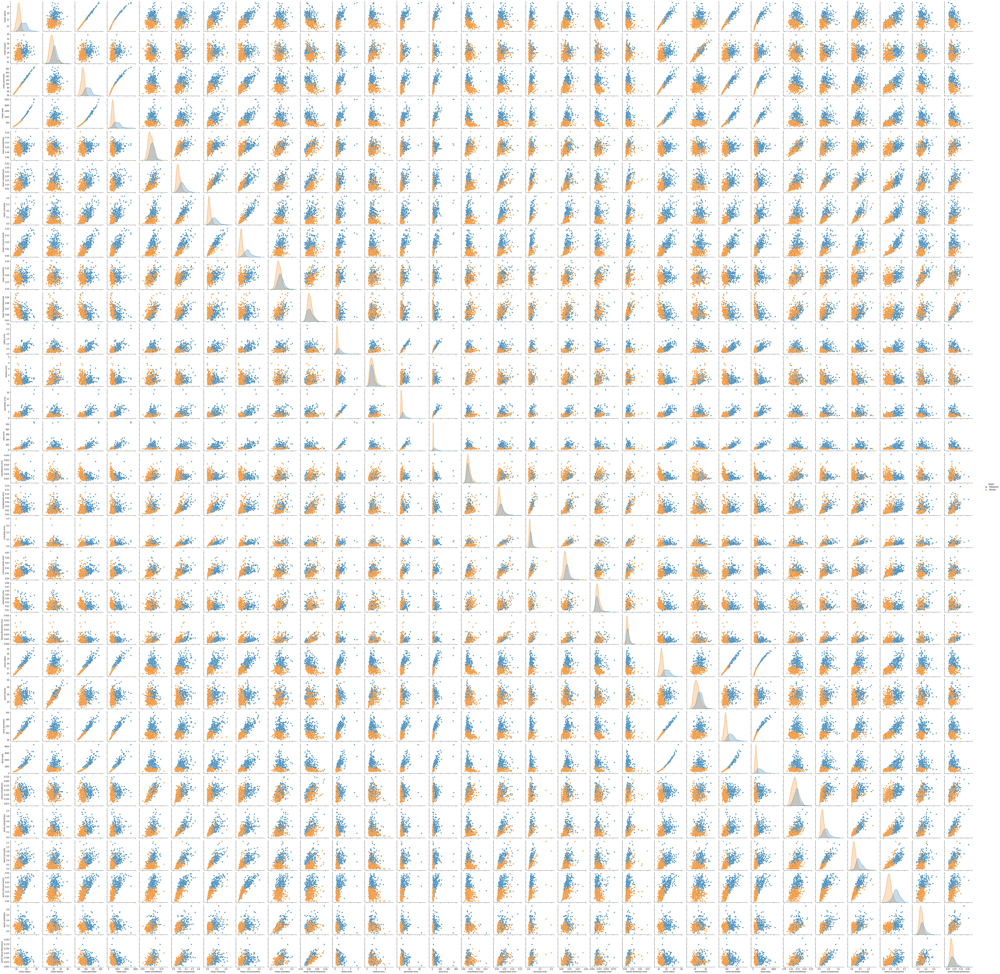

In [69]:
sns.pairplot(df, hue='target')
plt.show()

In [74]:
fig = px.violin(df, x='target',y='mean perimeter',box=True,template='plotly_dark')
fig.show()

In [76]:
### **Data pre-processing**

In [224]:
df.isna().sum()

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
target                     0
dtype: int64

There is no missing values in a data. Thus, performing this model for evaluation.

In [42]:
# splitting data of independent features and labelled feature
x = df.loc[:,df.columns != 'target'].values
y = df['target'].values

### **Evaluation methods to identify the optimum number of clusters**

### **1. Elbow Method**

The elbow method involves finding a metric to evaluate how good a clustering outcome is for various value of K and finding the **elbow point**.

The most popular metric used under Elbow method is the **Within Cluster Sum of Squares (WCSS)** which minimizes the variation in the paritition of cluster such as k-means clustering between data points and their assigned cluster's centroids. (i.e. WCSS minimizes total within cluster variation.)

**The following algorithm is to define the optimal clusters:**

1. Compute clustering algorithm (e.g., k-means clustering) for different values of k. For instance, by varying k from 1 to 10 clusters.
2. For each k, calculate the total within cluster sum of square (wcss)
3. Plot the curve of wcss according to the number of clusters k.
4. The location of a bend (elbow/knee) in the plot is generally considered as an indicator of the appropriate number of clusters.

In [43]:
# importing 'KMeans' from  'sklearn.cluster' library
from sklearn.cluster import KMeans

# Computing WCSS for k=1 to k=11
K = range(1,11) 
wcss = []

for k in K:
    kmeans = KMeans(n_clusters = k, init = 'k-means++',     
                    max_iter = 300, n_init = 10, random_state = 0) # 'k-means++' selects initial cluster centers for K-Means clustering in a smart way to speed up convergence.
    kmeans.fit(x) # Fit the data to kmeans
    wcss.append(kmeans.inertia_) # 'inertia_'(float value)- sum of squared distances of samples to their closest cluster center

kmeans.cluster_centers_  # Centroids-Coordinates of cluster centers for k values from range 1 to 11

array([[1.21455932e+01, 1.81380226e+01, 7.80731638e+01, 4.54409605e+02,
        9.29466102e-02, 7.94957062e-02, 4.50697271e-02, 2.58724633e-02,
        1.74355367e-01, 6.23671751e-02, 2.76933333e-01, 1.19986271e+00,
        1.96683559e+00, 2.05246328e+01, 6.80219209e-03, 2.03920169e-02,
        2.39684441e-02, 9.61710734e-03, 2.03990395e-02, 3.30623446e-03,
        1.34072316e+01, 2.42203955e+01, 8.71858757e+01, 5.49828814e+02,
        1.26831299e-01, 1.92067401e-01, 1.75194616e-01, 7.76532260e-02,
        2.78178531e-01, 7.95596045e-02],
       [2.15155556e+01, 2.22900000e+01, 1.43500000e+02, 1.44777778e+03,
        1.05643333e-01, 1.72666667e-01, 2.30311111e-01, 1.23965556e-01,
        1.92922222e-01, 5.98566667e-02, 9.43188889e-01, 1.34288889e+00,
        6.73000000e+00, 1.33467778e+02, 7.24866667e-03, 4.09688889e-02,
        5.30066667e-02, 1.54411111e-02, 2.05711111e-02, 4.06888889e-03,
        2.77111111e+01, 3.02744444e+01, 1.88077778e+02, 2.35211111e+03,
        1.43888889e-01,

In [44]:
# identifying labels of cluster for each point 

cluster_labels = kmeans.fit_predict(x)
# (or) labels = kmeans.labels_ 
cluster_labels

array([6, 6, 3, 0, 3, 5, 3, 5, 5, 5, 9, 2, 2, 9, 5, 9, 9, 2, 1, 5, 0, 7,
       9, 1, 6, 2, 5, 2, 2, 2, 3, 5, 2, 6, 2, 2, 5, 0, 5, 5, 5, 0, 3, 5,
       5, 3, 7, 5, 0, 5, 0, 5, 0, 2, 9, 0, 6, 9, 0, 7, 7, 7, 9, 7, 5, 9,
       7, 0, 7, 0, 6, 7, 3, 5, 0, 2, 0, 3, 3, 0, 0, 0, 4, 2, 0, 3, 5, 3,
       0, 5, 5, 5, 5, 5, 9, 3, 0, 7, 0, 5, 5, 7, 0, 7, 7, 5, 0, 0, 1, 0,
       7, 0, 5, 7, 7, 0, 7, 9, 2, 2, 0, 3, 1, 5, 0, 5, 5, 3, 5, 3, 0, 9,
       2, 9, 3, 0, 0, 0, 9, 7, 7, 2, 0, 0, 7, 0, 0, 5, 5, 5, 0, 7, 7, 7,
       5, 0, 2, 9, 0, 0, 0, 3, 1, 0, 1, 5, 7, 2, 3, 5, 0, 9, 9, 7, 7, 7,
       7, 9, 0, 0, 4, 6, 2, 0, 9, 7, 2, 0, 0, 0, 5, 0, 7, 5, 5, 0, 5, 2,
       3, 9, 0, 2, 6, 9, 0, 9, 7, 2, 0, 9, 3, 0, 4, 9, 5, 5, 0, 7, 6, 1,
       5, 5, 7, 9, 5, 5, 7, 5, 0, 5, 2, 0, 0, 6, 7, 5, 4, 6, 5, 2, 5, 0,
       0, 5, 3, 7, 0, 0, 7, 0, 6, 0, 6, 2, 6, 5, 6, 9, 2, 9, 6, 2, 2, 9,
       2, 4, 7, 5, 0, 7, 5, 0, 1, 7, 2, 0, 0, 2, 5, 5, 3, 0, 3, 9, 0, 0,
       0, 0, 7, 0, 5, 5, 0, 0, 0, 5, 7, 0, 5, 7, 6,

In [45]:
# Extracting WCSS for each cluster 
mycentroids = pd.DataFrame({'Clusters':K, 'WCSS':wcss})
mycentroids

,Clusters,WCSS
0,1,2.566772e+08
1,2,7.794310e+07
2,3,4.726484e+07
3,4,2.922654e+07
4,5,2.053524e+07
5,6,1.655872e+07
6,7,1.327786e+07
7,8,1.118354e+07
8,9,9.448162e+06
9,10,8.393357e+06


#### **Visualization of WCSS to identify Elbow point**

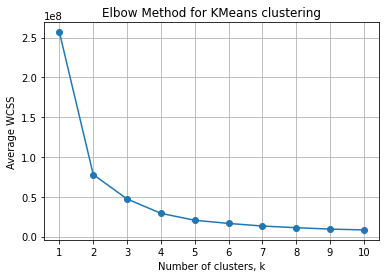

In [46]:
# Plotting the results onto a line graph, 
# `allowing us to observe 'The elbow'
plt.plot(K, wcss, marker='o', markersize=6)
plt.title('Elbow Method for KMeans clustering')
plt.xticks(range(1,11))
plt.grid(True)
plt.xlabel('Number of clusters, k')
plt.ylabel('Average WCSS') # Within cluster sum of squares
plt.show()

From the above elbow graph, we can see that **3 is the optimal number of clusters as it appears to be the bend in the elbow**. (i.e. by picking the value of k, where the **average distance falls suddenly**.)

### **2. Silhouette Method**

* The **Silhouette Method** is also a method to find the optimal number of clusters and interpretation and validation of consistency within clusters of data.

* Silhouette Analysis determines how well each object lies within its clusters.

* The silhouette method computes silhouette coefficients of each point that measure how much a point is similar to its own cluster compared to other clusters.

* Silhouette analysis studies the separation distance between the resulting clusters which was calculated with a distance metric, such as the Euclidean distance.

The coefficient can take values in the interval [-1, 1].

* If it is 0 –> the sample is very close to the decision boundary between two neighboring clusters.

* If it is 1(>0) –> the sample is far away from the neighboring clusters.

* If it is -1(<0) –> the samples might have been assigned to the wrong cluster or the samples are outliers.

In [47]:
# importing silhouette samples & its score from 'sklearn.metrics' library
from sklearn.metrics import silhouette_samples, silhouette_score

silhouette_scores = []

cluster_range = range(2,11)
for k in cluster_range:
  km = KMeans(n_clusters=k, random_state=10)
  km.fit(x)
  score = silhouette_score(x, km.labels_)
  print("The average Silhouette Score for k = ", k, "is", score)
  silhouette_scores.append(score)

The average Silhouette Score for k =  2 is 0.6972646156059464
The average Silhouette Score for k =  3 is 0.6660201620263425
The average Silhouette Score for k =  4 is 0.5334614737117133
The average Silhouette Score for k =  5 is 0.5102292997907838
The average Silhouette Score for k =  6 is 0.4857922435948332
The average Silhouette Score for k =  7 is 0.4676241057484445
The average Silhouette Score for k =  8 is 0.46824565183432526
The average Silhouette Score for k =  9 is 0.4621389195806988
The average Silhouette Score for k =  10 is 0.46672677982915495


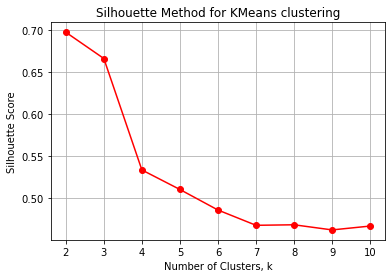

In [48]:
plt.plot(cluster_range, silhouette_scores, marker='o', color='r', markersize=6)
plt.title('Silhouette Method for KMeans clustering')
plt.xticks(cluster_range)
plt.grid(True)
plt.xlabel("Number of Clusters, k")
plt.ylabel("Silhouette Score")
plt.show()

The value of **k** that yields the highest Silhouette Score is considered as the optimal **k**. So, the **optimal k is 2**. From the elbow method, we got 3 as the optimal k.

Thus, finally concluding that ***k=2 is the optimum number of clusters***.

### **Training the K-means algorithm on the input dataset**

In [77]:
# Running KMeans to the dataset -- k=2
kmeans = KMeans(n_clusters = 2, init = 'k-means++',
                max_iter = 400, n_init = 10, random_state = 42)
y_kmeans = kmeans.fit_predict(x)
centroids = kmeans.cluster_centers_
y_labels = kmeans.labels_
y_labels

array([1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,

In [78]:
centers = kmeans.cluster_centers_
centers

array([[1.25562991e+01, 1.85703653e+01, 8.11234703e+01, 4.96061872e+02,
        9.48844977e-02, 9.10998174e-02, 6.24377642e-02, 3.34325434e-02,
        1.78057991e-01, 6.34540183e-02, 3.04190868e-01, 1.21515320e+00,
        2.15288059e+00, 2.37852922e+01, 7.17326256e-03, 2.34746895e-02,
        2.87455128e-02, 1.06363242e-02, 2.06135799e-02, 3.74750297e-03,
        1.40439018e+01, 2.47095434e+01, 9.19375114e+01, 6.19647945e+02,
        1.29959110e-01, 2.23311758e-01, 2.19214947e-01, 9.13298425e-02,
        2.83553653e-01, 8.32819406e-02],
       [1.93799237e+01, 2.16945802e+01, 1.28231298e+02, 1.18592977e+03,
        1.01294580e-01, 1.48612977e-01, 1.76939466e-01, 1.00698779e-01,
        1.91539695e-01, 6.06029008e-02, 7.42803817e-01, 1.22253817e+00,
        5.25058015e+00, 9.56781679e+01, 6.59868702e-03, 3.21766947e-02,
        4.24197710e-02, 1.56739847e-02, 2.03039695e-02, 3.95338931e-03,
        2.37094656e+01, 2.89126718e+01, 1.58496183e+02, 1.75302290e+03,
        1.40424733e-01,

### **Visualizing the clusters**

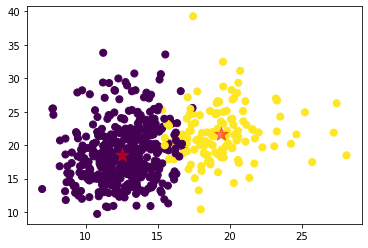

In [79]:
plt.scatter(x[:, 0], x[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red',marker='*', label = 'centroids', s=200, alpha=0.5);

In [80]:
pd.crosstab(y, y_labels)

col_0,0,1
row_0,,
Benign,356,1
Malignant,82,130


This shows that 
* 'Benign' has one misclassification to its neigbour cluster-'Malignant', and
* 'Malignant' has 82 misclassification to its neighbour cluster-'Benign'.

Hence, our prediction with optimum number of two clusters, k=2 gives misclassification result on 83 observations.

We can also see how well the other clusters are prediciting on real data. For instance, we use k=3:

In [81]:
# Running KMeans to the dataset -- k=3
kmeans_3 = KMeans(n_clusters = 3, init = 'k-means++',
                max_iter = 400, n_init = 10, random_state = 42)
y_kmeans_3 = kmeans_3.fit_predict(x)
centroids_3 = kmeans_3.cluster_centers_
y_labels_3 = kmeans_3.labels_

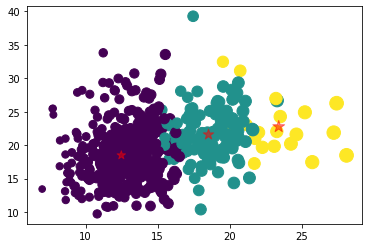

In [85]:
plt.scatter(x[:, 0], x[:, 1], x[:, 2], c=y_kmeans_3, cmap='viridis')

centers = kmeans_3.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], centers[:, 2], c='red',marker='*', label = 'centroids', alpha=0.5);

In [86]:
pd.crosstab(y, y_labels_3)

col_0,0,1,2
row_0,,,
Benign,355,2,0
Malignant,74,119,19


Here, clearly I can see that misclassification rate is high compared to K=2 clusters. This is most due to outliers.

## **Therefore, best optimum number of clusters is 2 to predict new data.**

Hence, concludes the K-Means Clustering.